In [1]:
import anndata
import numpy as np
import scipy as sp
import scvelo as scv
import scanpy as sc
import sys
import pandas as pd
import torch
import os.path
sys.path.append('../../')
import topovelo as tpv
import matplotlib.pyplot as plt
from scipy.io import mmread, mmwrite
from numpy import savetxt
%load_ext autoreload
%autoreload 2

In [2]:
# !mkdir /nfs/turbo/umms-welchjd/yichen/data/TopoVelo/perf
perf_logger = tpv.PerfLogger(save_path='/nfs/turbo/umms-welchjd/yichen/data/TopoVelo/perf')
#                             checkpoints = ['/nfs/turbo/umms-welchjd/yichen/data/TopoVelo/perf/simulation.csv',
#                                            '/nfs/turbo/umms-welchjd/yichen/data/TopoVelo/perf/simulation_type.csv',
#                                            '/nfs/turbo/umms-welchjd/yichen/data/TopoVelo/perf/simulation_multi.csv',
#                                            '/nfs/turbo/umms-welchjd/yichen/data/TopoVelo/perf/simulation_multi_type.csv'])

In [3]:
figure_path = '/nfs/turbo/umms-welchjd/yichen/figures/TopoVelo/simulation'

In [4]:
def pseudo_celltype(adata, n_type):
    t = adata.obs['true_time'].to_numpy()
    tmax, tmin = t.max(), t.min()
    delta_t = (tmax - tmin) / n_type
    cell_labels = np.array(['0']*adata.n_obs)
    for i in range(n_type - 1):
        cell_labels[(t >= tmin+delta_t*i) & (t <  tmin+delta_t*(i+1))] = str(i)
    cell_labels[t >= tmin+delta_t*(n_type-1)] = f'{n_type-1}'
    adata.obs['clusters'] = cell_labels
    scv.pl.scatter(adata, basis='spatial')

# Performance Comparison

In [5]:
datasets = ['Bidirectional', 'Radial']
adata_paths = {
    'Bidirectional': '/nfs/turbo/umms-welchjd/yichen/data/TopoVelo/simulation/bilinear_out.h5ad',
    'Radial': '/nfs/turbo/umms-welchjd/yichen/data/TopoVelo/simulation/multiradial_out_corrected.h5ad'
}

In [6]:
methods = ['scVelo', 'VeloVAE', 'VeloVAE (Rate Prior)', 'TopoVelo (GCN)', 'TopoVelo (GAT)']
keys = ['fit', 'vv', 'fullvb', 'tpv', 'gat']
cluster_edges = [('0', '1'),
                 ('1', '2'),
                 ('2', '3'),
                 ('3', '4')]

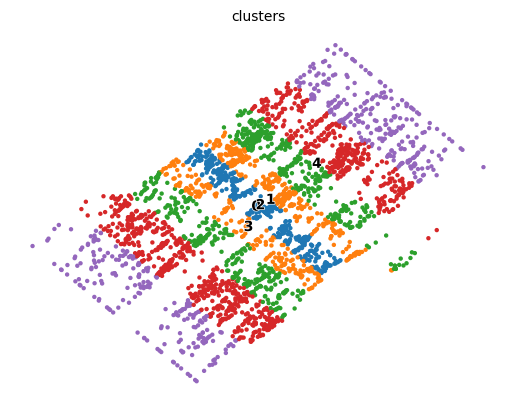

Computing a spatial graph using KNN on X_spatial with k=30
computing neighbors
    finished (0:00:02) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
*** Computing performance metrics 1/5 ***
computing velocity graph (using 1/36 cores)


  0%|          | 0/3000 [00:00<?, ?cells/s]

    finished (0:00:01) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'velocity_spatial', embedded velocity vectors (adata.obsm)
Finished. 

*** Computing performance metrics 2/5 ***
computing velocity graph (using 1/36 cores)


  0%|          | 0/3000 [00:00<?, ?cells/s]

    finished (0:00:01) --> added 
    'vv_velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'vv_velocity_spatial', embedded velocity vectors (adata.obsm)
Finished. 

*** Computing performance metrics 3/5 ***
computing velocity graph (using 1/36 cores)


  0%|          | 0/3000 [00:00<?, ?cells/s]

    finished (0:00:01) --> added 
    'fullvb_velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'fullvb_velocity_spatial', embedded velocity vectors (adata.obsm)
Finished. 

*** Computing performance metrics 4/5 ***
computing velocity graph (using 1/36 cores)


  0%|          | 0/3000 [00:00<?, ?cells/s]

    finished (0:00:01) --> added 
    'tpv_velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'tpv_velocity_spatial', embedded velocity vectors (adata.obsm)
Finished. 

*** Computing performance metrics 5/5 ***
computing velocity graph (using 1/36 cores)


  0%|          | 0/3000 [00:00<?, ?cells/s]

    finished (0:00:01) --> added 
    'gat_velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'gat_velocity_spatial', embedded velocity vectors (adata.obsm)
Finished. 

---     Integrating Peformance Metrics     ---
Dataset Size: 3000 cells, 500 genes
---   Plotting  Results   ---


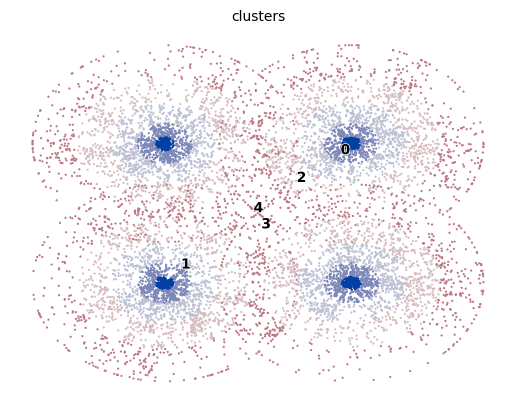

Computing a spatial graph using KNN on X_spatial with k=30
computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
*** Computing performance metrics 1/5 ***
computing velocity graph (using 6/36 cores)


  0%|          | 0/12000 [00:00<?, ?cells/s]

    finished (0:00:18) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:02) --> added
    'velocity_spatial', embedded velocity vectors (adata.obsm)
Finished. 

*** Computing performance metrics 2/5 ***
computing velocity graph (using 6/36 cores)


  0%|          | 0/12000 [00:00<?, ?cells/s]

    finished (0:00:07) --> added 
    'vv_velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:02) --> added
    'vv_velocity_spatial', embedded velocity vectors (adata.obsm)
Finished. 

*** Computing performance metrics 3/5 ***
computing velocity graph (using 6/36 cores)


  0%|          | 0/12000 [00:00<?, ?cells/s]

    finished (0:00:07) --> added 
    'fullvb_velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:02) --> added
    'fullvb_velocity_spatial', embedded velocity vectors (adata.obsm)
Finished. 

*** Computing performance metrics 4/5 ***
computing velocity graph (using 6/36 cores)


  0%|          | 0/12000 [00:00<?, ?cells/s]

    finished (0:00:07) --> added 
    'tpv_velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:02) --> added
    'tpv_velocity_spatial', embedded velocity vectors (adata.obsm)
Finished. 

*** Computing performance metrics 5/5 ***
computing velocity graph (using 6/36 cores)


  0%|          | 0/12000 [00:00<?, ?cells/s]

    finished (0:00:06) --> added 
    'gat_velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:02) --> added
    'gat_velocity_spatial', embedded velocity vectors (adata.obsm)
Finished. 

---     Integrating Peformance Metrics     ---
Dataset Size: 12000 cells, 500 genes
---   Plotting  Results   ---


In [7]:
for dataset in datasets:
    adata = anndata.read_h5ad(adata_paths[dataset])
    pseudo_celltype(adata, 5)
    (res, res_type,
     res_multi, res_multi_type) = tpv.post_analysis(adata,
                                                    dataset,
                                                    methods,
                                                    keys,
                                                    spatial_graph_key='spatial_graph',
                                                    spatial_velocity_graph=True,
                                                    n_spatial_neighbors=30,
                                                    spatial_key='X_spatial',
                                                    compute_metrics=True,
                                                    genes=np.random.choice(adata.var_names, 4),
                                                    grid_size=(1, 4),
                                                    embed='spatial',
                                                    plot_type=[],
                                                    cluster_edges=cluster_edges)
    perf_logger.insert(dataset, res, res_type, res_multi, res_multi_type)

# Compute the velocity metrics for spatial decoders

In [8]:
for dataset in datasets:
    adata = anndata.read_h5ad(adata_paths[dataset])

    adata.obsm[f'tpv_velocity_spatial'] = adata.obsm['tpv_velocity_tpv_xy']
    _, cbdir = tpv.cross_boundary_correctness(adata,
                                              'clusters',
                                              'tpv_velocity',
                                              cluster_edges,
                                              spatial_graph_key='spatial_graph',
                                              return_raw=False,
                                              x_emb='X_spatial',
                                              gene_mask=adata.var['velocity_genes'].to_numpy())
    perf_logger.df.loc[('CBDir', 'Spatial Decoder (GCN)'), dataset] = cbdir
    adata.obsm[f'gat_velocity_spatial'] = adata.obsm['gat_velocity_gat_xy']
    _, cbdir = tpv.cross_boundary_correctness(adata,
                                              'clusters',
                                              'gat_velocity',
                                              cluster_edges,
                                              spatial_graph_key='spatial_graph',
                                              return_raw=False,
                                              x_emb='X_spatial',
                                              gene_mask=adata.var['velocity_genes'].to_numpy())
    perf_logger.df.loc[('CBDir', 'Spatial Decoder (GAT)'), dataset] = cbdir

In [9]:
for dataset in datasets:
    adata = anndata.read_h5ad(adata_paths[dataset])

    adata.obsm[f'tpv_velocity_spatial'] = adata.obsm['tpv_velocity_tpv_xy']
    kcbdir, mean_kcbdir =  tpv.gen_cross_boundary_correctness(adata,
                                                              'clusters',
                                                              'tpv_velocity',
                                                              cluster_edges,
                                                              'tpv_time',
                                                              spatial_graph_key="spatial_graph",
                                                              k_hop=5,
                                                              x_emb='X_spatial',
                                                              gene_mask=adata.var['velocity_genes'].to_numpy(),
                                                              n_prune=30,
                                                              random_state=2022)
    for i in range(1, 6):
        perf_logger.df_multi.loc[('K-CBDir', 'Spatial Decoder (GCN)'), (dataset, f'{i}-step')] = mean_kcbdir[i-1]
    adata.obsm[f'gat_velocity_spatial'] = adata.obsm['gat_velocity_gat_xy']
    kcbdir, mean_kcbdir =  tpv.gen_cross_boundary_correctness(adata,
                                                              'clusters',
                                                              'gat_velocity',
                                                              cluster_edges,
                                                              'gat_time',
                                                              spatial_graph_key="spatial_graph",
                                                              k_hop=5,
                                                              x_emb='X_spatial',
                                                              gene_mask=adata.var['velocity_genes'].to_numpy(),
                                                              n_prune=30,
                                                              random_state=2022)
    for i in range(1, 6):
        perf_logger.df_multi.loc[('K-CBDir', 'Spatial Decoder (GAT)'), (dataset, f'{i}-step')] = mean_kcbdir[i-1]

# Compare with True Velocity 

In [10]:
def vel_accuracy(adata, vkey):
    true_v = adata.obsm['true_spatial_velocity']
    v = adata.obsm[vkey]
    norm_1 = np.linalg.norm(true_v, axis=1)
    norm_2 = np.linalg.norm(v, axis=1)
    zero_mask = (norm_1 * norm_2 == 0).astype(int)
    return np.mean((true_v * v).sum(1)/(zero_mask * 1 + (1-zero_mask) * norm_1 * norm_2))

In [11]:
for dataset in datasets:
    adata = anndata.read_h5ad(adata_paths[dataset])
    scv.pp.neighbors(adata, n_neighbors=30, use_rep='spatial', method='sklearn')
    for method, key in zip(methods, keys):
        if method == 'scVelo':
            vkey='velocity'
        else:
            vkey=f'{key}_velocity'
        
        scv.tl.velocity_graph(adata, vkey=vkey)
        scv.tl.velocity_embedding(adata, vkey=vkey, basis='spatial')
        perf_logger.df.loc[('Velocity Accuracy', method), dataset] = vel_accuracy(adata, f'{vkey}_spatial')
    perf_logger.df.loc[('Velocity Accuracy', 'Spatial Decoder (GCN)'), dataset] = vel_accuracy(adata, f'tpv_velocity_tpv_xy')
    perf_logger.df.loc[('Velocity Accuracy', 'Spatial Decoder (GAT)'), dataset] = vel_accuracy(adata, f'gat_velocity_gat_xy')

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing velocity graph (using 1/36 cores)


  0%|          | 0/3000 [00:00<?, ?cells/s]

    finished (0:00:01) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'velocity_spatial', embedded velocity vectors (adata.obsm)
computing velocity graph (using 1/36 cores)


  0%|          | 0/3000 [00:00<?, ?cells/s]

    finished (0:00:02) --> added 
    'vv_velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'vv_velocity_spatial', embedded velocity vectors (adata.obsm)
computing velocity graph (using 1/36 cores)


  0%|          | 0/3000 [00:00<?, ?cells/s]

    finished (0:00:02) --> added 
    'fullvb_velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'fullvb_velocity_spatial', embedded velocity vectors (adata.obsm)
computing velocity graph (using 1/36 cores)


  0%|          | 0/3000 [00:00<?, ?cells/s]

    finished (0:00:02) --> added 
    'tpv_velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'tpv_velocity_spatial', embedded velocity vectors (adata.obsm)
computing velocity graph (using 1/36 cores)


  0%|          | 0/3000 [00:00<?, ?cells/s]

    finished (0:00:02) --> added 
    'gat_velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'gat_velocity_spatial', embedded velocity vectors (adata.obsm)
computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing velocity graph (using 1/36 cores)


  0%|          | 0/12000 [00:00<?, ?cells/s]

    finished (0:00:07) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:02) --> added
    'velocity_spatial', embedded velocity vectors (adata.obsm)
computing velocity graph (using 1/36 cores)


  0%|          | 0/12000 [00:00<?, ?cells/s]

    finished (0:00:09) --> added 
    'vv_velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:02) --> added
    'vv_velocity_spatial', embedded velocity vectors (adata.obsm)
computing velocity graph (using 1/36 cores)


  0%|          | 0/12000 [00:00<?, ?cells/s]

    finished (0:00:09) --> added 
    'fullvb_velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:02) --> added
    'fullvb_velocity_spatial', embedded velocity vectors (adata.obsm)
computing velocity graph (using 1/36 cores)


  0%|          | 0/12000 [00:00<?, ?cells/s]

    finished (0:00:09) --> added 
    'tpv_velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:02) --> added
    'tpv_velocity_spatial', embedded velocity vectors (adata.obsm)
computing velocity graph (using 1/36 cores)


  0%|          | 0/12000 [00:00<?, ?cells/s]

    finished (0:00:09) --> added 
    'gat_velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:02) --> added
    'gat_velocity_spatial', embedded velocity vectors (adata.obsm)


In [12]:
perf_logger.save('simulation')

In [13]:
perf_logger.df = perf_logger.df.rename(index={'MSE Train': 'Reconstruction Error'})

In [14]:
perf_logger.metrics.extend(['Reconstruction Error', 'Velocity Accuracy'])

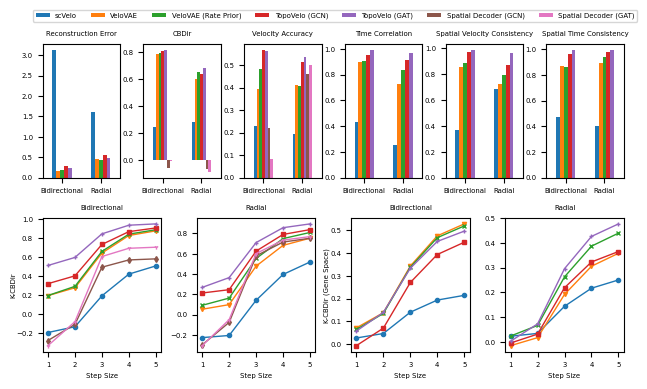

In [15]:
perf_logger.plot(['Reconstruction Error',
                  'CBDir',
                  'Velocity Accuracy',
                  'Time Correlation',
                  'Spatial Velocity Consistency',
                  'Spatial Time Consistency',
                  'K-CBDir',
                  'K-CBDir (Gene Space)'],
                 legend_metric='Velocity Accuracy',
                 grid_size_params={'ncols_scalar': np.array([6]), 'ncols_multi': [4]},
                 figsize=(7.5, 4),
                 title_fontsize=5,
                 legend_fontsize=5,
                 ylabel_fontsize=5,
                 labelpad=0,
                 tick_fontsize=5,
                 hspace=0.3,
                 wspace=0.3,
                 ncols_legend=7,
                 bbox_to_anchor=(0, 0.95, 1.03, 0),
                 figure_path=figure_path,
                 figure_name='simulation',
                 dpi=300,
                 save_format='pdf')

In [22]:
adata = anndata.read_h5ad(adata_paths['Bidirectional'])

# Plotting

In [42]:
adata = anndata.read_h5ad(adata_paths['Bidirectional'])
tpv.scvelo_preprocessing.neighbors(adata, n_neighbors=50, method='sklearn', use_rep='X_spatial')

computing neighbors
0.002010899992392456
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)


In [8]:
n_type = 5
t = adata.obs['true_time'].to_numpy()
tmax, tmin = t.max(), t.min()
delta_t = (tmax - tmin) / n_type
cell_labels = np.array(['0']*adata.n_obs)
for i in range(4):
    cell_labels[(t >= tmin+delta_t*i) & (t <  tmin+delta_t*(i+1))] = str(i)
cell_labels[t >= tmin+delta_t*4] = '4'
print(np.unique(cell_labels))
adata.obs['clusters'] = cell_labels

['0' '1' '2' '3' '4']


In [9]:
stream_figsize = (6, 3)
dot_size = 30
stream_legend_loc = "right margin"

computing velocity graph (using 2/32 cores)


  0%|          | 0/3000 [00:00<?, ?cells/s]

    finished (0:00:03) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'velocity_spatial', embedded velocity vectors (adata.obsm)
saving figure to file /nfs/turbo/umms-welchjd/yichen/figures/TopoVelo/simulation/bilinear_fit_spknn.png


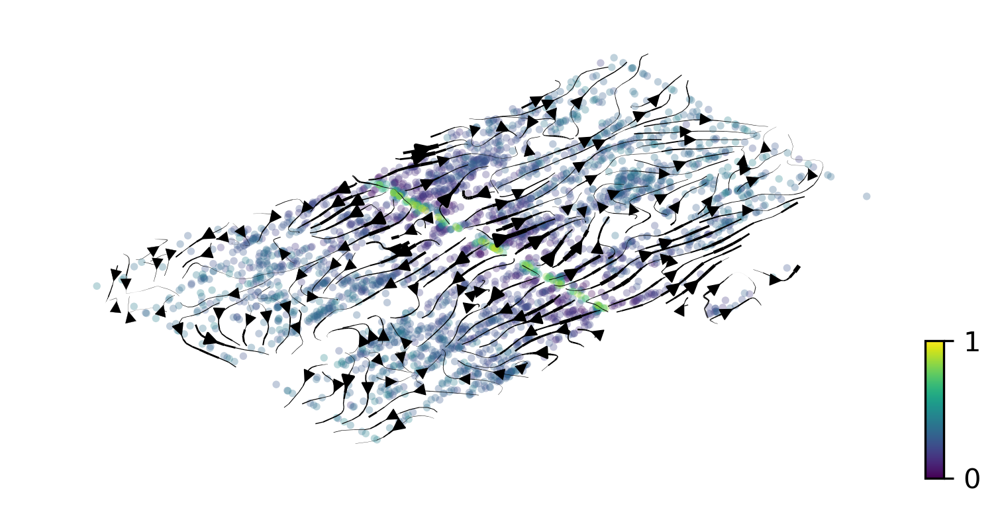

computing velocity graph (using 2/32 cores)


  0%|          | 0/3000 [00:00<?, ?cells/s]

    finished (0:00:04) --> added 
    'vv_velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'vv_velocity_spatial', embedded velocity vectors (adata.obsm)
saving figure to file /nfs/turbo/umms-welchjd/yichen/figures/TopoVelo/simulation/bilinear_vv_spknn.png


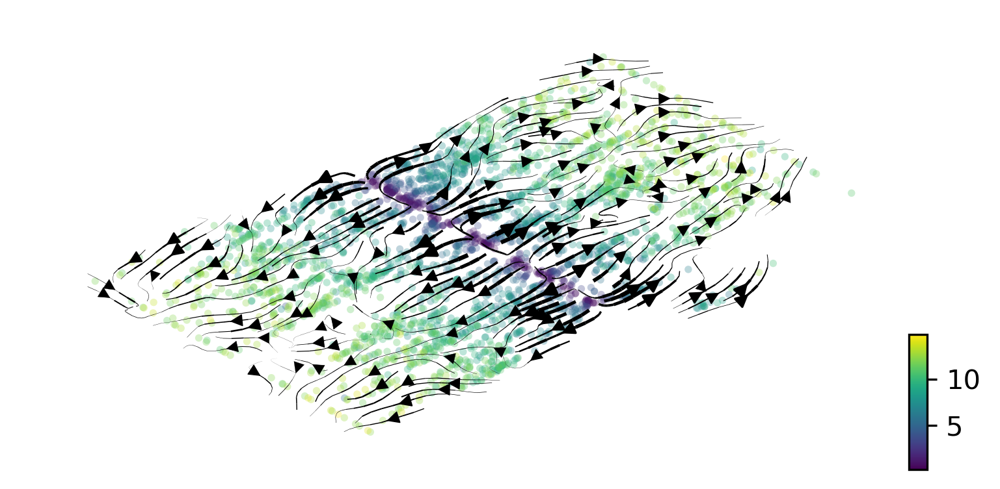

computing velocity graph (using 2/32 cores)


  0%|          | 0/3000 [00:00<?, ?cells/s]

    finished (0:00:04) --> added 
    'fullvb_velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'fullvb_velocity_spatial', embedded velocity vectors (adata.obsm)
saving figure to file /nfs/turbo/umms-welchjd/yichen/figures/TopoVelo/simulation/bilinear_fullvb_spknn.png


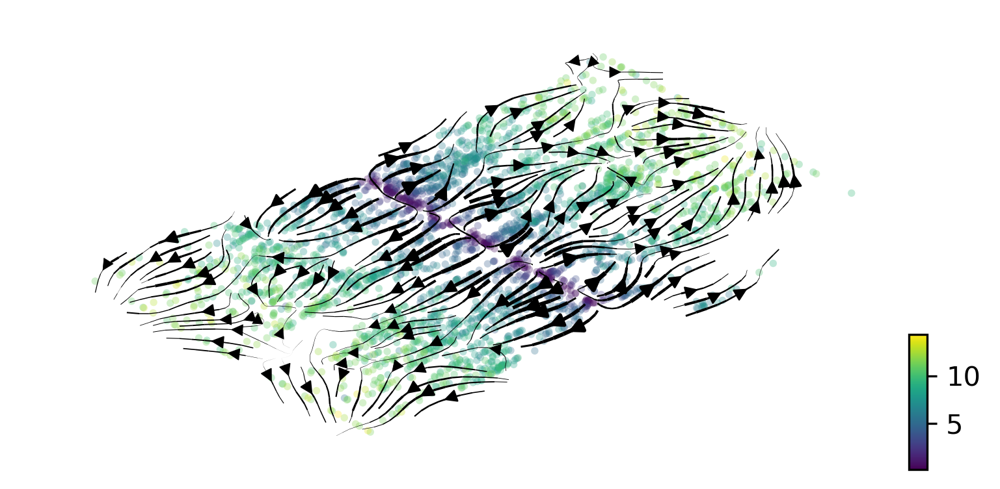

computing velocity graph (using 2/32 cores)


  0%|          | 0/3000 [00:00<?, ?cells/s]

    finished (0:00:04) --> added 
    'tpv_velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'tpv_velocity_spatial', embedded velocity vectors (adata.obsm)
saving figure to file /nfs/turbo/umms-welchjd/yichen/figures/TopoVelo/simulation/bilinear_tpv_spknn.png


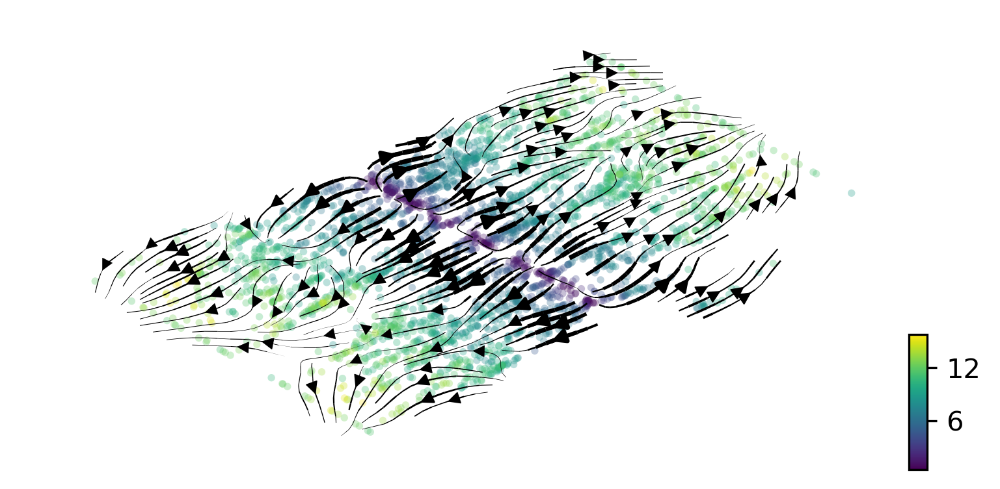

computing velocity graph (using 2/32 cores)


  0%|          | 0/3000 [00:00<?, ?cells/s]

    finished (0:00:04) --> added 
    'gat_velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:00) --> added
    'gat_velocity_spatial', embedded velocity vectors (adata.obsm)
saving figure to file /nfs/turbo/umms-welchjd/yichen/figures/TopoVelo/simulation/bilinear_gat_spknn.png


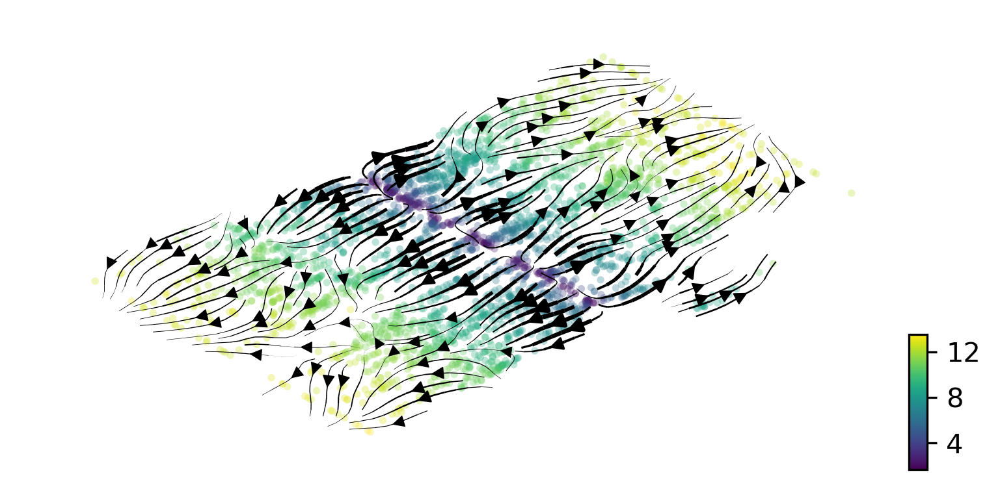

In [14]:
vkeys = ['velocity', 'vv_velocity', 'fullvb_velocity', 'tpv_velocity', 'gat_velocity']
tkeys = ['latent_time', 'vv_time', 'fullvb_time', 'tpv_time', 'gat_time']
for key, tkey, vkey in zip(keys, tkeys, vkeys):
    scv.tl.velocity_graph(adata, vkey=vkey, n_jobs=2)
    scv.pl.velocity_embedding_stream(adata,
                                     basis='spatial',
                                     vkey=vkey,
                                     color=tkey,
                                     color_map='viridis',
                                     title="",
                                     figsize=stream_figsize,
                                     size=dot_size,
                                     legend_fontsize=14,
                                     legend_loc=stream_legend_loc,
                                     cutoff_perc=0.0,
                                     dpi=300,
                                     show=True,
                                     add_margin=0.1,
                                     save=f'{figure_path}/bilinear_{key}_spknn.png')

In [38]:
adata.obsm

AxisArrays with keys: X_gat_xy, X_gat_xy0, X_pca, X_spatial, X_tpv_xy, X_tpv_xy0, X_umap, fullvb_std_z, fullvb_z, gat_std_z, gat_velocity_gat_xy, gat_z, tpv_std_z, tpv_velocity_tpv_xy, tpv_z, true_spatial_velocity, vv_std_z, vv_z, velocity_spatial, fullvb_velocity_spatial, gat_velocity_spatial

saving figure to file /nfs/turbo/umms-welchjd/yichen/figures/TopoVelo/simulation/bilinear_true_velocity.png


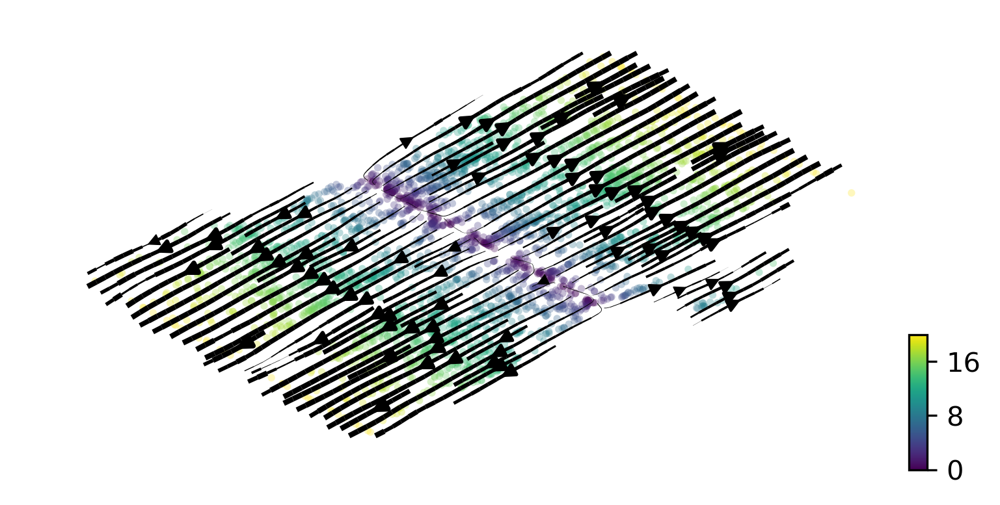

In [39]:
adata.obsm['true_velocity_spatial'] = adata.obsm['true_spatial_velocity']
scv.pl.velocity_embedding_stream(adata,
                                 basis='spatial',
                                 vkey='true_velocity',
                                 color='true_time',
                                 color_map='viridis',
                                 title="",
                                 figsize=stream_figsize,
                                 size=dot_size,
                                 legend_fontsize=14,
                                 legend_loc=stream_legend_loc,
                                 cutoff_perc=0.0,
                                 dpi=300,
                                 show=True,
                                 add_margin=0.1,
                                 save=f'{figure_path}/bilinear_true_velocity.png')

In [52]:
'X_gat_xy' in adata.obsm
'gat_velocity_gat_xy' in adata.obsm

True

saving figure to file /nfs/turbo/umms-welchjd/yichen/figures/TopoVelo/simulation/bilinear_tpvdec_velocity.png


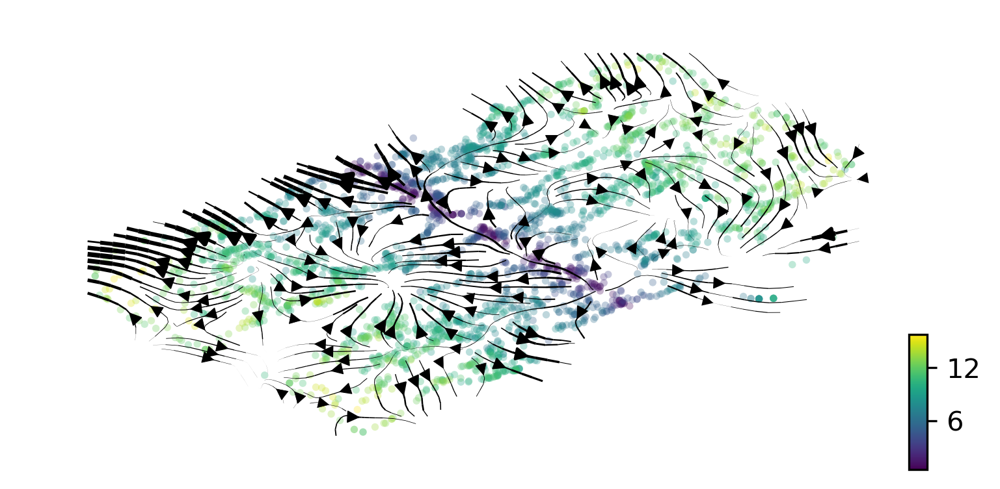

In [72]:
# adata.obsm['tpv_velocity_spatial'] = adata.obsm['tpv_velocity_tpv_xy']
# adata.obsm['X_spatial'] = adata.obsm['X_tpv_xy']
scv.pl.velocity_embedding_stream(adata,
                                 basis='tpv_xy',
                                 vkey='tpv_velocity',
                                 color='tpv_time',
                                 color_map='viridis',
                                 title="",
                                 figsize=stream_figsize,
                                 size=dot_size,
                                 legend_fontsize=14,
                                 legend_loc=stream_legend_loc,
                                 cutoff_perc=0.0,
                                 dpi=300,
                                 show=True,
                                 add_margin=0.1,
                                 save=f'{figure_path}/bilinear_tpvdec_velocity.png')

In [25]:
adata = anndata.read_h5ad(adata_paths['Radial'])
# remove duplicate coordinates
for center in  [[np.sqrt(2)/2, np.sqrt(2)/2],
                [np.sqrt(2)/2, -np.sqrt(2)/2],
                [-np.sqrt(2)/2, np.sqrt(2)/2],
                [-np.sqrt(2)/2, -np.sqrt(2)/2]]:
    indices = np.where((adata.obsm['X_spatial'][:, 0] == center[0]) | (adata.obsm['X_spatial'][:, 1] == center[1]))[0]
    print(len(indices))
    if len(indices) > 0:
        eps = np.random.normal(0, 1e-4, size=(len(indices), 2))
        adata.obsm['X_spatial'][indices] += eps
adata.write_h5ad('/nfs/turbo/umms-welchjd/yichen/data/TopoVelo/simulation/multiradial_out_corrected.h5ad')

300
100
0
0


In [63]:
scv.pp.neighbors(adata, n_neighbors=50, method='sklearn', use_rep='X_spatial')

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)


In [11]:
n_type = 5
t = adata.obs['true_time'].to_numpy()
tmax, tmin = t.max(), t.min()
delta_t = (tmax - tmin) / n_type
cell_labels = np.array(['0']*adata.n_obs)
for i in range(4):
    cell_labels[(t >= tmin+delta_t*i) & (t <  tmin+delta_t*(i+1))] = str(i)
cell_labels[t >= tmin+delta_t*4] = '4'
print(np.unique(cell_labels))
adata.obs['clusters'] = cell_labels

['0' '1' '2' '3' '4']


computing velocity graph (using 4/32 cores)


  0%|          | 0/12000 [00:00<?, ?cells/s]

    finished (0:00:22) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:03) --> added
    'velocity_spatial', embedded velocity vectors (adata.obsm)
saving figure to file /nfs/turbo/umms-welchjd/yichen/figures/TopoVelo/simulation/radial_fit_spknn.png


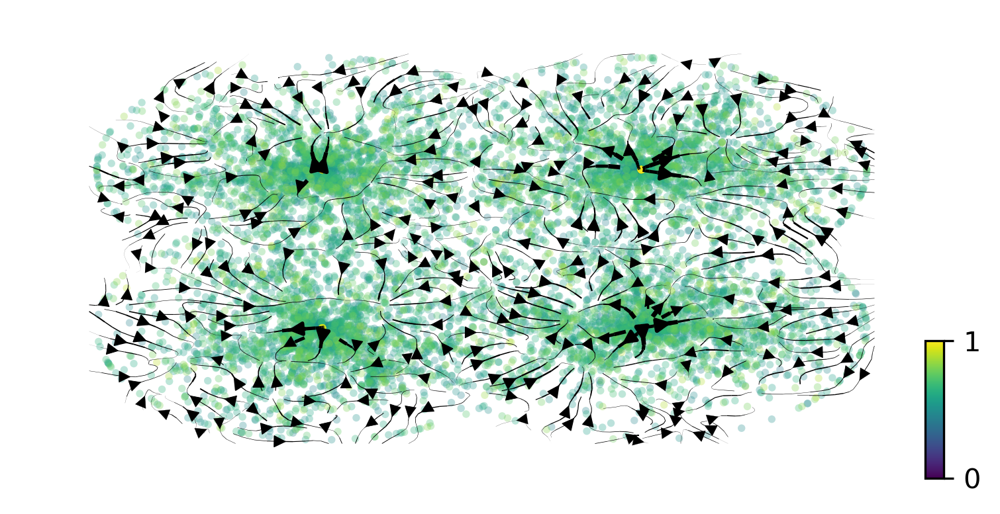

computing velocity graph (using 4/32 cores)


  0%|          | 0/12000 [00:00<?, ?cells/s]

    finished (0:00:09) --> added 
    'vv_velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:03) --> added
    'vv_velocity_spatial', embedded velocity vectors (adata.obsm)
saving figure to file /nfs/turbo/umms-welchjd/yichen/figures/TopoVelo/simulation/radial_vv_spknn.png


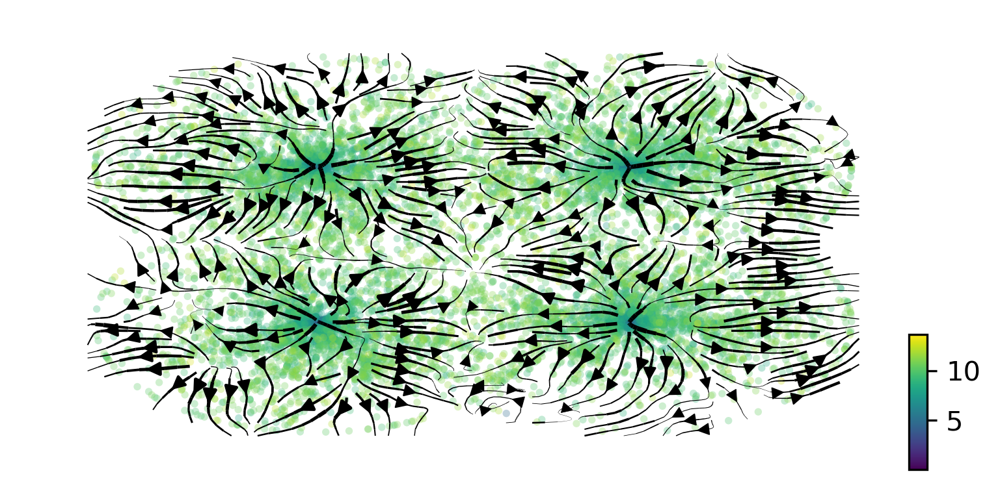

computing velocity graph (using 4/32 cores)


  0%|          | 0/12000 [00:00<?, ?cells/s]

    finished (0:00:09) --> added 
    'fullvb_velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:03) --> added
    'fullvb_velocity_spatial', embedded velocity vectors (adata.obsm)
saving figure to file /nfs/turbo/umms-welchjd/yichen/figures/TopoVelo/simulation/radial_fullvb_spknn.png


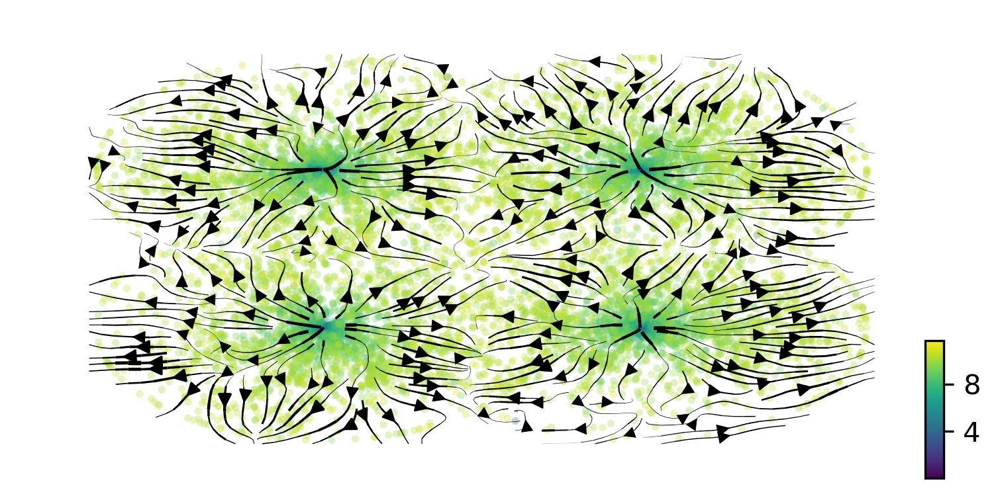

computing velocity graph (using 4/32 cores)


  0%|          | 0/12000 [00:00<?, ?cells/s]

    finished (0:00:10) --> added 
    'tpv_velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:03) --> added
    'tpv_velocity_spatial', embedded velocity vectors (adata.obsm)
saving figure to file /nfs/turbo/umms-welchjd/yichen/figures/TopoVelo/simulation/radial_tpv_spknn.png


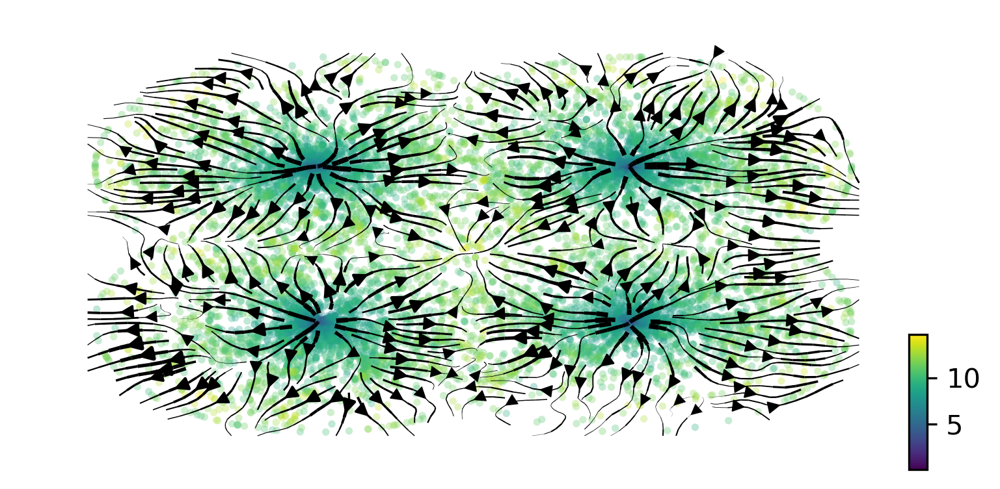

computing velocity graph (using 4/32 cores)


  0%|          | 0/12000 [00:00<?, ?cells/s]

    finished (0:00:09) --> added 
    'gat_velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:02) --> added
    'gat_velocity_spatial', embedded velocity vectors (adata.obsm)
saving figure to file /nfs/turbo/umms-welchjd/yichen/figures/TopoVelo/simulation/radial_gat_spknn.png


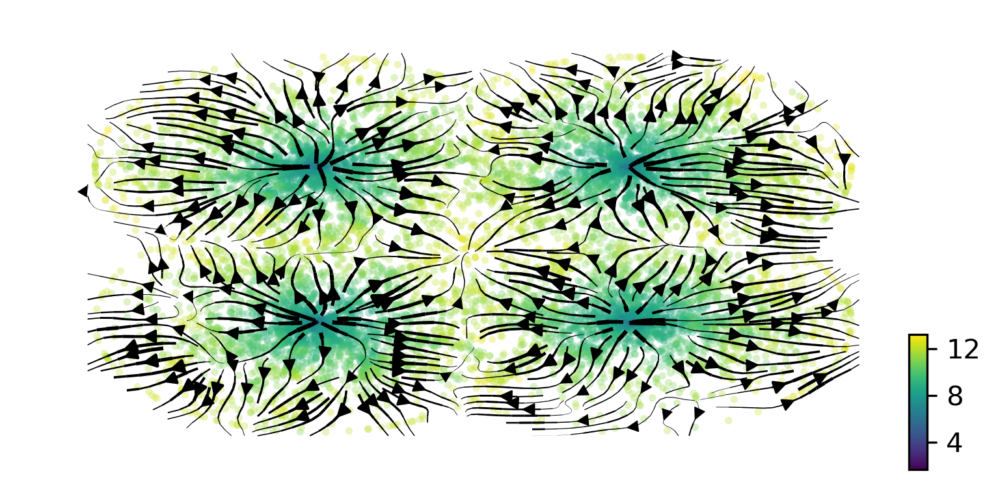

In [64]:
vkeys = ['velocity', 'vv_velocity', 'fullvb_velocity', 'tpv_velocity', 'gat_velocity']
tkeys = ['latent_time', 'vv_time', 'fullvb_time', 'tpv_time', 'gat_time']
for key, tkey, vkey in zip(keys, tkeys, vkeys):
    scv.tl.velocity_graph(adata, vkey=vkey, n_jobs=4)
    scv.pl.velocity_embedding_stream(adata,
                                     basis='spatial',
                                     vkey=vkey,
                                     color=tkey,
                                     color_map='viridis',
                                     title="",
                                     figsize=stream_figsize,
                                     size=dot_size,
                                     legend_fontsize=14,
                                     legend_loc=stream_legend_loc,
                                     cutoff_perc=0.0,
                                     dpi=300,
                                     show=True,
                                     add_margin=0.1,
                                     save=f'{figure_path}/radial_{key}_spknn.png')

saving figure to file /nfs/turbo/umms-welchjd/yichen/figures/TopoVelo/simulation/radial_true_velocity.png


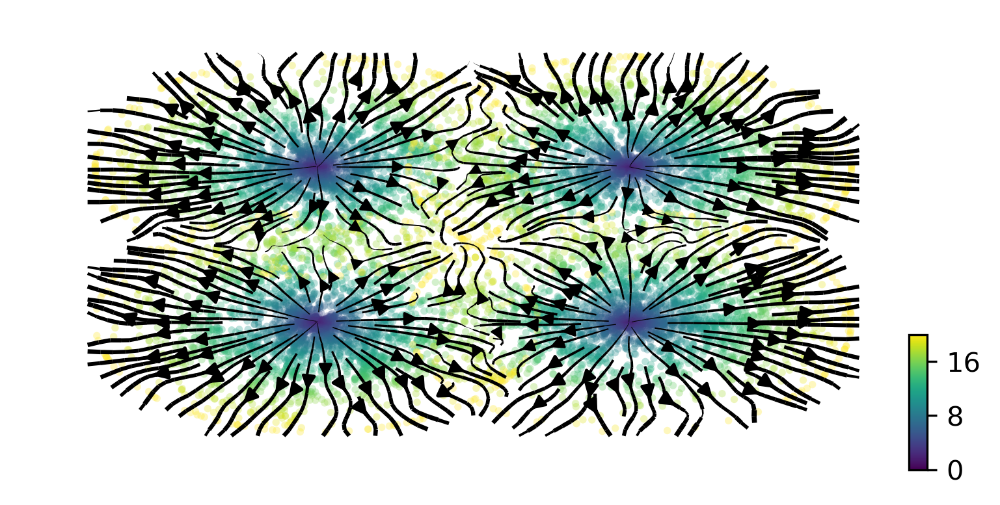

In [32]:
adata.obsm['true_velocity_spatial'] = adata.obsm['true_spatial_velocity']
scv.pl.velocity_embedding_stream(adata,
                                 basis='spatial',
                                 vkey='true_velocity',
                                 color='true_time',
                                 color_map='viridis',
                                 title="",
                                 figsize=stream_figsize,
                                 size=dot_size,
                                 legend_fontsize=14,
                                 legend_loc=stream_legend_loc,
                                 cutoff_perc=0.0,
                                 dpi=300,
                                 show=True,
                                 add_margin=0.1,
                                 save=f'{figure_path}/radial_true_velocity.png')

saving figure to file /nfs/turbo/umms-welchjd/yichen/figures/TopoVelo/simulation/radial_gatdec_velocity.png


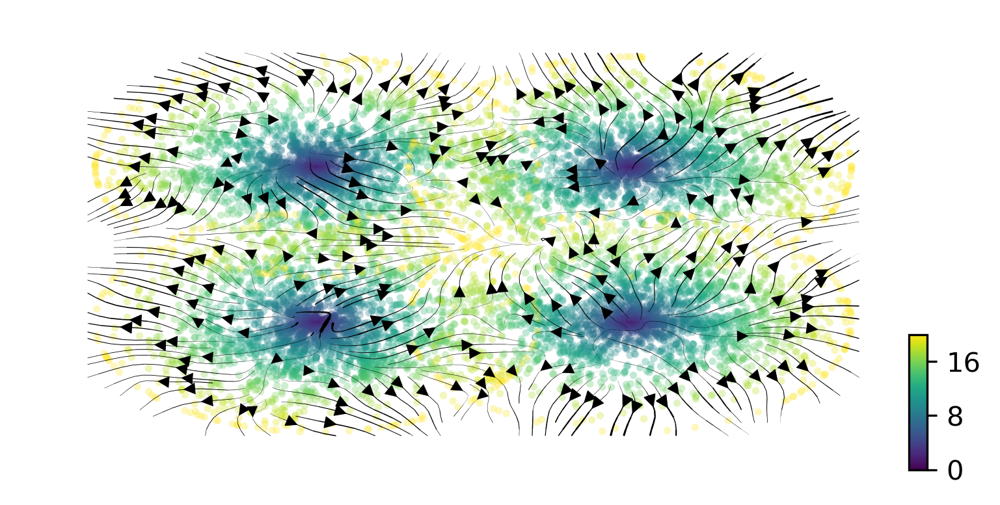

In [44]:
adata.obsm['gatdec_velocity_spatial'] = adata.obsm['gat_velocity_gat_xy']
scv.pl.velocity_embedding_stream(adata,
                                 basis='spatial',
                                 vkey='gatdec_velocity',
                                 color='true_time',
                                 color_map='viridis',
                                 title="",
                                 figsize=stream_figsize,
                                 size=dot_size,
                                 legend_fontsize=14,
                                 legend_loc=stream_legend_loc,
                                 cutoff_perc=0.0,
                                 dpi=300,
                                 show=True,
                                 add_margin=0.1,
                                 save=f'{figure_path}/radial_gatdec_velocity.png')